In [2]:
import pandas as pd
df= pd.read_csv("Surgical-deepnet.csv")

In [19]:
df

,bmi,Age,asa_status,baseline_cancer,baseline_charlson,baseline_cvd,baseline_dementia,baseline_diabetes,baseline_digestive,baseline_osteoart,...,complication_rsi,dow,gender,hour,month,moonphase,mort30,mortality_rsi,race,complication
0,19.31,59.2,1,1,0,0,0,0,0,0,...,-0.57,3,0,7.63,6,1,0,-0.43,1,0
1,18.73,59.1,0,0,0,0,0,0,0,0,...,0.21,0,0,12.93,0,1,0,-0.41,1,0
2,21.85,59.0,0,0,0,0,0,0,0,0,...,0.00,2,0,7.68,5,3,0,0.08,1,0
3,18.49,59.0,1,0,1,0,0,1,1,0,...,-0.65,2,1,7.58,4,3,0,-0.32,1,0
4,19.70,59.0,1,0,0,0,0,0,0,0,...,0.00,0,0,7.88,11,0,0,0.00,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14630,18.79,14.1,1,0,1,0,0,0,0,0,...,-0.54,1,0,7.78,0,1,0,-0.16,1,1
14631,19.65,12.6,0,0,0,0,0,0,0,0,...,-1.42,4,0,8.40,6,1,0,-0.77,1,1
14632,14.84,12.6,1,0,0,0,0,0,0,0,...,0.65,0,0,13.25,3,3,0,0.99,1,1
14633,17.75,8.9,0,0,1,0,0,0,1,0,...,-0.50,0,1,8.30,5,0,0,0.17,1,1


In [20]:
df.columns

Index(['bmi', 'Age', 'asa_status', 'baseline_cancer', 'baseline_charlson',
       'baseline_cvd', 'baseline_dementia', 'baseline_diabetes',
       'baseline_digestive', 'baseline_osteoart', 'baseline_psych',
       'baseline_pulmonary', 'ahrq_ccs', 'ccsComplicationRate',
       'ccsMort30Rate', 'complication_rsi', 'dow', 'gender', 'hour', 'month',
       'moonphase', 'mort30', 'mortality_rsi', 'race', 'complication'],
      dtype='object')

In [21]:

#Counting NAs to assess data quality
na_per_column = pd.DataFrame(df.isna().sum(), columns=['NA_Count']) # here a table showing the number of NA 
na_per_column

,NA_Count
bmi,0
Age,0
asa_status,0
baseline_cancer,0
baseline_charlson,0
baseline_cvd,0
baseline_dementia,0
baseline_diabetes,0
baseline_digestive,0
baseline_osteoart,0


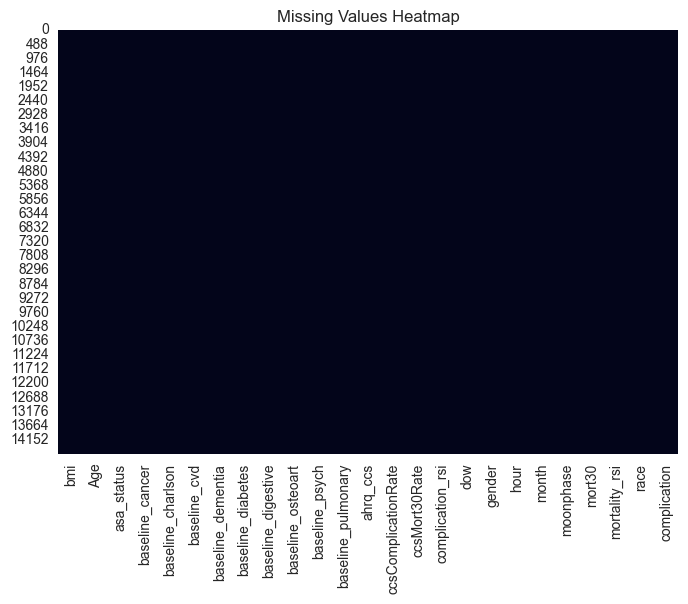

In [22]:
#Some columns in the figure below indicate the presence of missing values.
import seaborn as sns
import matplotlib.pyplot as plt
sns.heatmap(df.isnull(), cbar=False)
plt.title('Missing Values Heatmap')
plt.show()

<Axes: >

<Figure size 3000x3000 with 0 Axes>

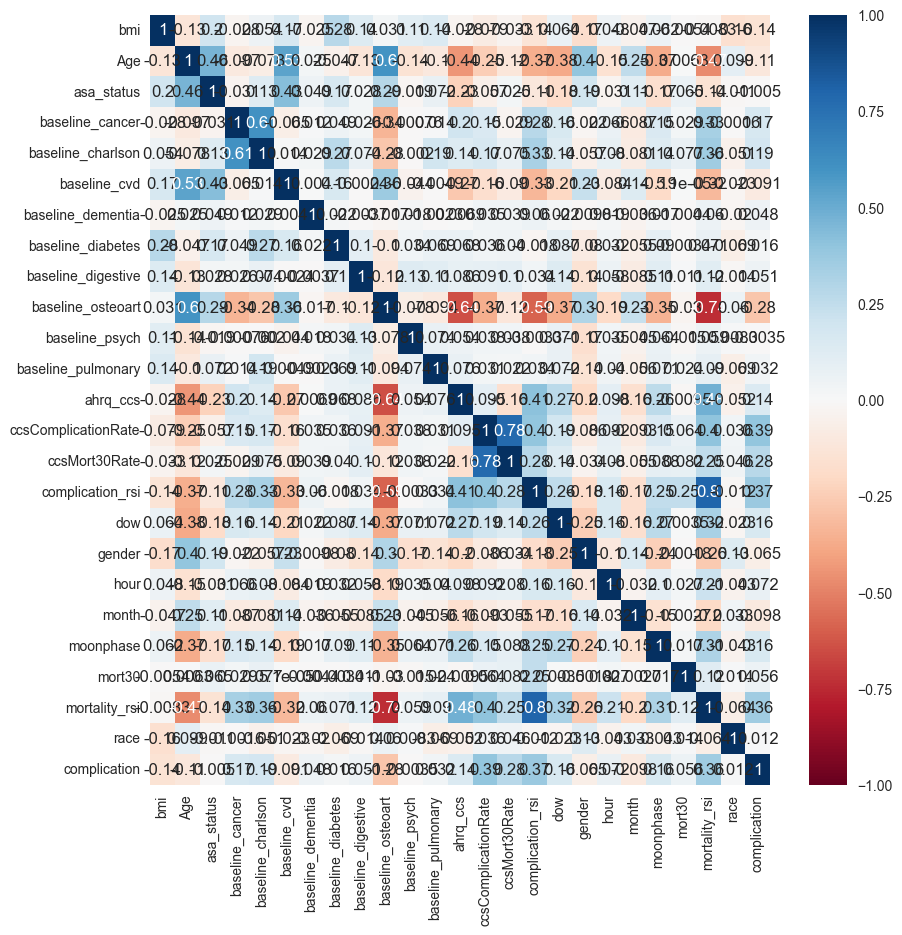

In [23]:
plt.figure(figsize=(30, 30))
plt.figure(figsize = (10,10))
sns.heatmap(df.corr(), annot =True, vmin = -1, vmax=1 ,cmap='RdBu')


In [24]:
from pandas_profiling import ProfileReport
profile = ProfileReport(df, explorative=True)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [25]:
from pandas_profiling import ProfileReport
profile = ProfileReport(df, explorative=True)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
sns.pairplot(df)
plt.show()

In [4]:

from pycaret.classification import setup, compare_models, finalize_model, predict_model
df2 =df[['bmi', 'Age', 'asa_status', 'baseline_cancer', 'baseline_charlson',
       'baseline_cvd', 'baseline_dementia', 'baseline_diabetes',
       'baseline_digestive', 'baseline_osteoart', 'baseline_psych',
       'baseline_pulmonary', 'ahrq_ccs', 'ccsComplicationRate',
       'ccsMort30Rate', 'complication_rsi', 'dow', 'gender', 'hour', 'month', 'moonphase', 'mort30', 'mortality_rsi', 'race']]
exp1 = setup(data=df, target='complication')

# Compare models and select the best one
best_model = compare_models()

# Finalize the best model on the entire training data
final_model = finalize_model(best_model)


,Description,Value
0,Session id,657
1,Target,complication
2,Target type,Binary
3,Original data shape,"(14635, 25)"
4,Transformed data shape,"(14635, 25)"
5,Transformed train set shape,"(10244, 25)"
6,Transformed test set shape,"(4391, 25)"
7,Numeric features,24
8,Preprocess,True
9,Imputation type,simple


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
gbc,Gradient Boosting Classifier,0.9066,0.9281,0.6795,0.9315,0.7855,0.7277,0.7426,0.4520
lightgbm,Light Gradient Boosting Machine,0.9060,0.9306,0.6946,0.9117,0.7880,0.7291,0.7405,0.2640
ada,Ada Boost Classifier,0.8852,0.9100,0.6613,0.8504,0.7439,0.6714,0.6803,0.1370
rf,Random Forest Classifier,0.8618,0.9044,0.5734,0.8256,0.6765,0.5923,0.6083,0.3180
knn,K Neighbors Classifier,0.8572,0.8259,0.5134,0.8664,0.6443,0.5622,0.5926,0.0960
dt,Decision Tree Classifier,0.8502,0.8086,0.7248,0.6946,0.7090,0.6082,0.6087,0.0420
et,Extra Trees Classifier,0.8192,0.8617,0.4502,0.7302,0.5566,0.4510,0.4720,0.3380
lr,Logistic Regression,0.7958,0.8069,0.3573,0.6827,0.4687,0.3573,0.3862,1.0390
ridge,Ridge Classifier,0.7937,0.8097,0.3368,0.6853,0.4513,0.3421,0.3750,0.0180
lda,Linear Discriminant Analysis,0.7931,0.8097,0.3837,0.6532,0.4831,0.3645,0.3848,0.0240
